In [1]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import seaborn as sns
from importlib import reload
import warnings
import healpy as hp
import collections
from collections import namedtuple

sys.path.insert(0,'../../scripts/tools_for_VAE/')
from tools_for_VAE import cutout_img_dc2
from tools_for_VAE import plot

Instructions for updating:
non-resource variables are not supported in the long term


In [2]:
from astropy.io import fits
from astropy.coordinates import SkyCoord
from astropy.visualization import ZScaleInterval
from astropy.table import Table

In [3]:
import lsst.afw.display as afwDisplay
import lsst.afw.display.rgb as rgb

import FoFCatalogMatching
import GCRCatalogs
GCRCatalogs.set_root_dir_by_site('in2p3')
import fitsio

import lsst.afw.geom as afw_geom
import lsst.afw.table as afw_table
import lsst.daf.persistence as dp
import lsst.daf.persistence as dafPersist
import lsst.afw.geom as afwGeom
import lsst.afw.coord as afwCoord
import lsst.afw.image as afwImage
import lsst.afw.display as afwDisplay
import lsst.geom

%matplotlib inline
%config InlineBackend.figure_format='retina'

In [4]:
repo = '/sps/lssttest/dataproducts/desc/DC2/Run2.2i/v19.0.0-v1/rerun/run2.2i-coadd-wfd-dr6-v1-grizy'
butler = dafPersist.Butler(repo)

In [5]:
# Read in the galaxy catalog data.
with warnings.catch_warnings():
    warnings.filterwarnings('ignore')
    gc = GCRCatalogs.load_catalog('cosmoDC2_v1.1.4_image')

In [6]:
# Read in the galaxy catalog data.
with warnings.catch_warnings():
    warnings.filterwarnings('ignore')
    gc_obs = GCRCatalogs.load_catalog('dc2_object_run2.2i_dr6_wfd')

In [7]:
# Let's define a magnitude cut
mag_filters = [
    (np.isfinite, 'mag_r'),
    'mag_r < 24.5',
]

# Load ra and dec from object, using both of the filters we just defined.
object_data = gc_obs.get_quantities(['ra', 'dec'],
                                        filters=(mag_filters), native_filters=['tract == 4855'])

/pbs/home/b/barcelin/pbs_throng_link/lsst_stack/conda/miniconda3-py37_4.8.2/envs/lsst-scipipe-1a1d771/lib/python3.7/site-packages/GCRCatalogs-1.0.1-py3.7.egg/GCRCatalogs/dc2_dm_catalog.py:44: RuntimeWarning: invalid value encountered in log10
  return -2.5 * np.log10(flux) + AB_mag_zp_wrt_nanoJansky


In [8]:
max_ra = np.nanmax(object_data['ra'])
min_ra = np.nanmin(object_data['ra'])
max_dec = np.nanmax(object_data['dec'])
min_dec = np.nanmin(object_data['dec'])
vertices = hp.ang2vec(np.array([min_ra, max_ra, max_ra, min_ra]),
                      np.array([min_dec, min_dec, max_dec, max_dec]), lonlat=True)
ipix = hp.query_polygon(32, vertices, inclusive=True)
native_filter = f'(healpix_pixel == {ipix[0]})'
for ipx in ipix:
    native_filter=native_filter+f' | (healpix_pixel == {ipx})'
pos_filters=[f'ra >= {min_ra}',f'ra <={max_ra}', f'dec >= {min_dec}', f'dec <= {max_dec}']

truth_mag_filters = ['mag_r < 24.5']
quantities = ['galaxy_id', 'ra', 'dec']

truth_data = gc.get_quantities(quantities, filters=truth_mag_filters+pos_filters, 
                                      native_filters=native_filter)


In [9]:
results = FoFCatalogMatching.match(
    catalog_dict={'truth': truth_data, 'object': object_data},
    linking_lengths=0.1,#{5.0: 5, 4.0: 5, 3.0: 4, 2.0: 3, 1.0: None}, # Linking length of 1 arcsecond, you can play around with the values!
    catalog_len_getter=lambda x: len(x['ra']),
)


# first we need to know which rows are from the truth catalog and which are from the object
truth_mask = results['catalog_key'] == 'truth'
object_mask = ~truth_mask


# then np.bincount will give up the number of id occurrences (like historgram but with integer input)
n_groups = results['group_id'].max() + 1
n_truth = np.bincount(results['group_id'][truth_mask], minlength=n_groups)
n_object = np.bincount(results['group_id'][object_mask], minlength=n_groups)

In [10]:
one_to_one_group_mask = np.in1d(results['group_id'], np.flatnonzero((n_truth == 1) & (n_object == 1)))

truth_idx = results['row_index'][one_to_one_group_mask & truth_mask]
object_idx = results['row_index'][one_to_one_group_mask & object_mask]

## Load models results

In [11]:
e1_out_mean_once_concat, e2_out_mean_once_concat, e1_out_std_once_concat, e2_out_std_once_concat = np.load('data/net_once_concat.npy')
e1_out_mean_all_concat, e2_out_mean_all_concat, e1_out_std_all_concat, e2_out_std_all_concat = np.load('data/net_all_concat.npy')
e1_out_mean_bnn, e2_out_mean_bnn, e1_out_std_bnn, e2_out_std_bnn = np.load('data/net_bnn.npy')
e1_out_mean_no_psf, e2_out_mean_no_psf, e1_out_std_no_psf, e2_out_std_no_psf = np.load('data/net_no_psf.npy')
e1_out_mean_one_concat_dense, e2_out_mean_one_concat_dense, e1_out_std_one_concat_dense, e2_out_std_one_concat_dense = np.load('data/net_one_concat_dense.npy')

In [12]:
mean_results_e1 = [e1_out_mean_once_concat,e1_out_mean_all_concat,e1_out_mean_bnn,e1_out_mean_no_psf,e1_out_mean_one_concat_dense]
std_results_e1 = [e1_out_std_once_concat,e1_out_std_all_concat,e1_out_std_bnn,e1_out_std_no_psf,e1_out_std_one_concat_dense]

mean_results_e2 = [e2_out_mean_once_concat,e2_out_mean_all_concat,e2_out_mean_bnn,e2_out_mean_no_psf,e2_out_mean_one_concat_dense]
std_results_e2 = [e2_out_std_once_concat,e2_out_std_all_concat,e2_out_std_bnn,e2_out_std_no_psf,e2_out_std_one_concat_dense]

labels=['det one concat', 'det all concat', 'BNN', 'det no psf', 'det dense']

In [13]:
def gaussian(mean,std,x):
    return (1/(std*np.sqrt(2*np.pi))*np.exp(-np.square(x-mean)/(2*std**2)))

## Image for ellipticity posterior

In [14]:
root_dir_v1 = '/pbs/home/b/barcelin/sps_link/data/dc2_test/test_mag_24.5/' # mag cut at 24.5 in r band
data = pd.read_csv(root_dir_v1+'img_data.csv')

In [15]:
## Compute lensed ellipticities from shear and 
def calc_lensed_ellipticity_1(es1, es2, gamma1, gamma2, kappa):
    gamma = gamma1 + gamma2*1j # shear (as a complex number)
    es =  es1 + es2*1j # intrinsic ellipticity (as a complex number)
    g = gamma / (1.0 - kappa) # reduced shear
    e = (es + g) / (1.0 + g.conjugate()*es) # lensed ellipticity
    return np.real(e)

def calc_lensed_ellipticity_2(es1, es2, gamma1, gamma2, kappa):
    gamma = gamma1 + gamma2*1j # shear (as a complex number)
    es =   es1 + es2*1j # intrinsic ellipticity (as a complex number)
    g = gamma / (1.0 - kappa) # reduced shear
    e = (es + g) / (1.0 + g.conjugate()*es) # lensed ellipticity
    return np.imag(e)

def calc_lensed_ellipticity(es1, es2, gamma1, gamma2, kappa):
    gamma = gamma1 + gamma2*1j # shear (as a complex number)
    es =   es1 + es2*1j # intrinsic ellipticity (as a complex number)
    g = gamma / (1.0 - kappa) # reduced shear
    e = (es + g) / (1.0 + g.conjugate()*es) # lensed ellipticity
    return np.absolute(e)

ellipticity_conversion = lambda e: 2*e / (1.0+ellipticity[:len(e)]*ellipticity[:len(e)])

In [16]:
ell_1 = np.array(data['e1'])
ell_2 = np.array(data['e2'])
shear_1 = np.array(data['shear_1'])
shear_2 = np.array(data['shear_2'])
convergence = np.array(data['convergence'])

ellipticity = calc_lensed_ellipticity(ell_1, ell_2, shear_1, shear_2, convergence)
ellipticity_conversion = lambda e: 2*e / (1.0+ellipticity[:len(e)]*ellipticity[:len(e)])

e1 = ellipticity_conversion(calc_lensed_ellipticity_1(ell_1, ell_2, shear_1, shear_2, convergence))
e2 = ellipticity_conversion(calc_lensed_ellipticity_2(ell_1, ell_2, shear_1, shear_2, convergence))

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              10000 non-null  int64  
 1   e1              10000 non-null  float64
 2   e2              10000 non-null  float64
 3   shear_1         10000 non-null  float64
 4   shear_2         10000 non-null  float64
 5   redshift        10000 non-null  float64
 6   redshift_true   10000 non-null  float64
 7   blendedness     10000 non-null  float64
 8   snr_r           9996 non-null   float64
 9   convergence     10000 non-null  float64
 10  e1_hsm_regauss  9978 non-null   float64
 11  e2_hsm_regauss  9978 non-null   float64
 12  mag_r_meas      9996 non-null   float64
 13  mag_r_true      10000 non-null  float64
dtypes: float64(13), int64(1)
memory usage: 1.1 MB


In [18]:
blend_limit = 0.1
np.where(data['blendedness'][:1000] >blend_limit)[0]

array([ 11,  14,  59,  60,  71,  90,  95,  97, 103, 119, 133, 138, 205,
       243, 250, 298, 305, 307, 314, 321, 340, 344, 372, 379, 395, 463,
       495, 531, 539, 549, 563, 571, 586, 588, 593, 611, 623, 631, 633,
       661, 669, 682, 699, 718, 723, 776, 785, 810, 814, 822, 827, 838,
       844, 857, 859, 861, 881, 903, 914, 929, 978, 981, 986, 987, 995])

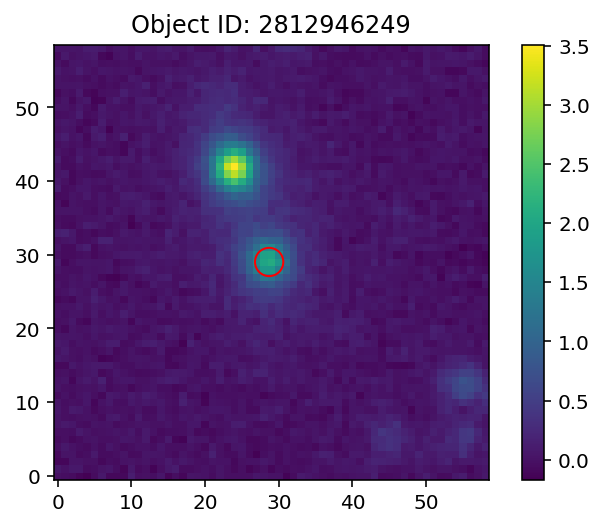

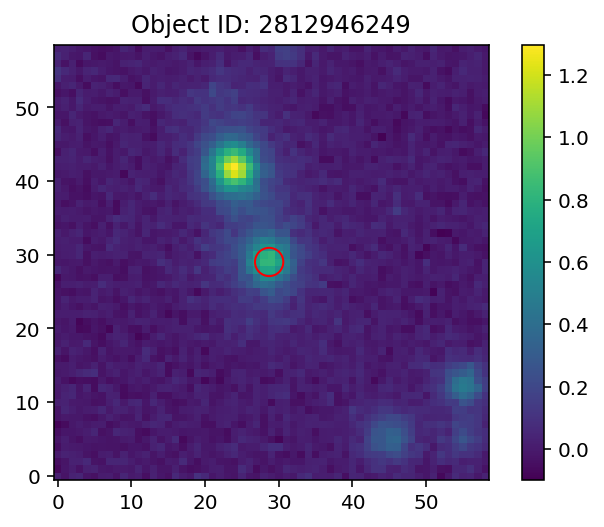

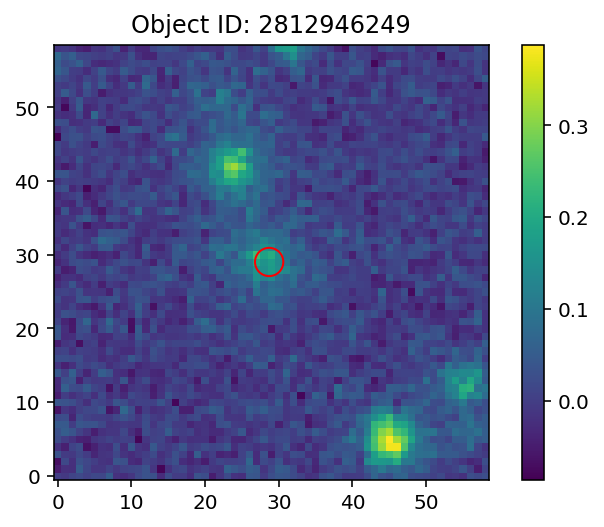

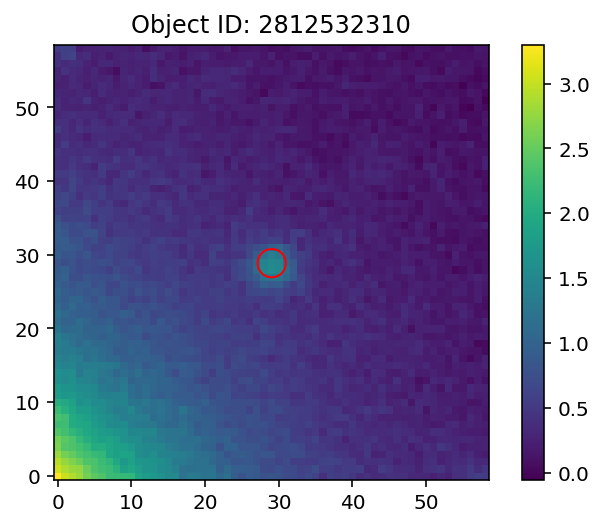

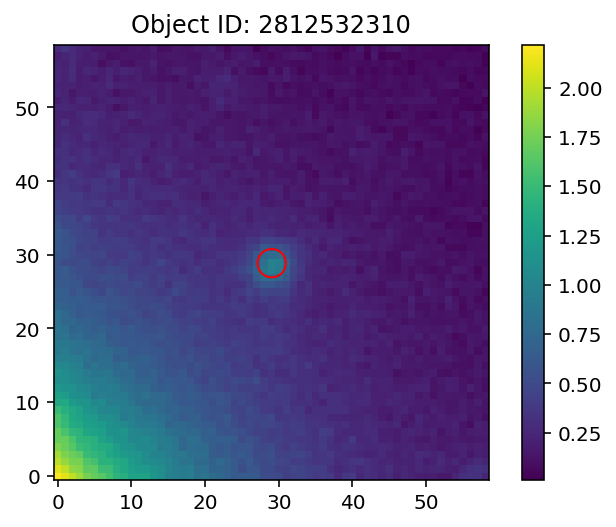

...

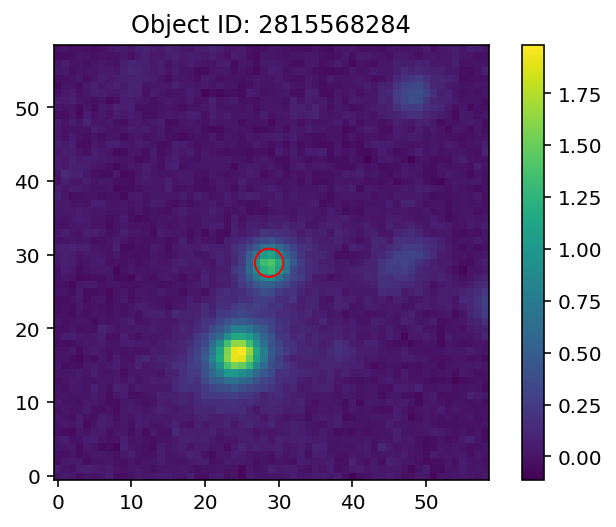

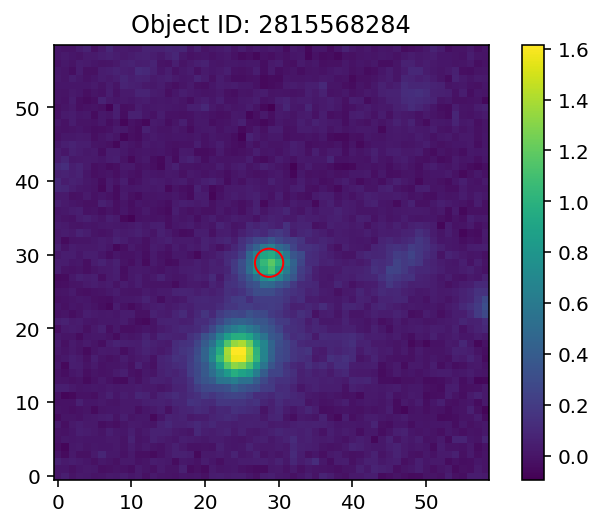

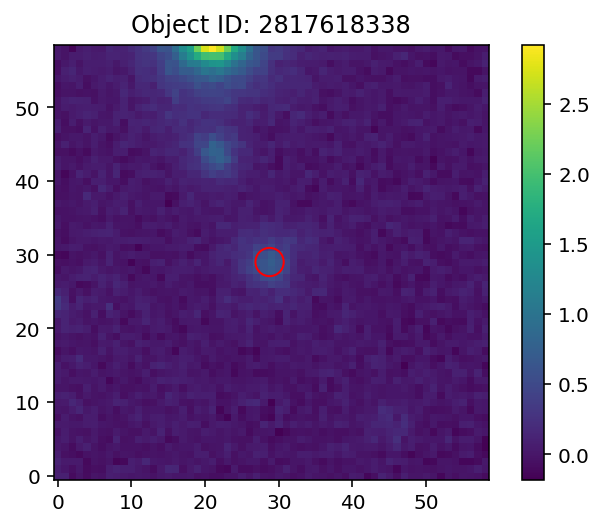

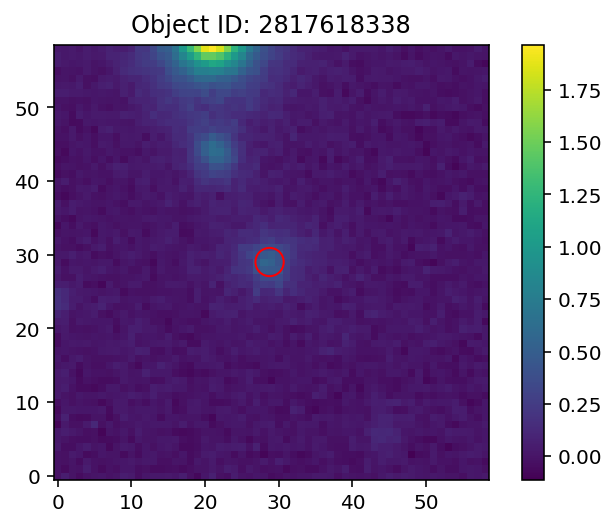

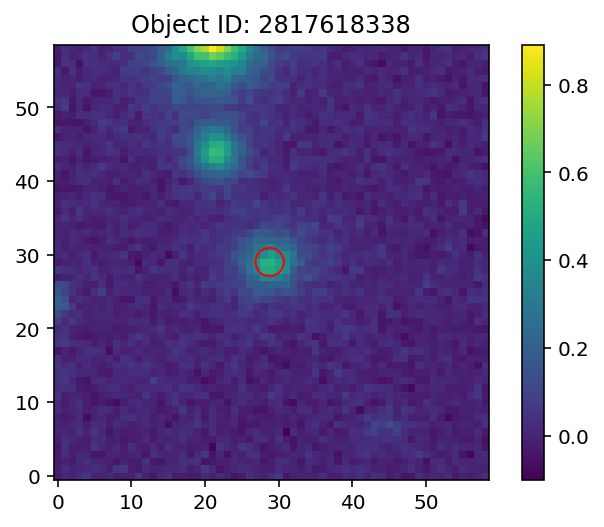

In [19]:
id_ra_dec = Table.from_pandas(pd.DataFrame.from_dict(object_data))

image_rgb=[]
for a,k in enumerate (np.where(data['blendedness'][:1000] >blend_limit)[0]):
    in_truth_data = np.where(truth_data['galaxy_id'] == data['id'][k])[0][0]
    truth_i = np.where(truth_idx == in_truth_data)[0][0]
  
    i = truth_i
    first = id_ra_dec[object_idx[i]]
    ra, dec = first['ra'], first['dec']
    
    cutouts=[cutout_img_dc2.make_cutout_image(butler, ra, dec, filter=band, label="Object ID: %d" % truth_data['galaxy_id'][truth_idx[i]]) for band in "irg"]
    #print(cutouts)
    image_rgb.append(rgb.makeRGB(*cutouts))
    del cutouts

In [20]:
fig, ax = plt.subplots(65,3, figsize=(12, 260), dpi=100)

x = np.linspace(-1,1, 1000)
for a,k in enumerate (np.where(data['blendedness'][:1000] >blend_limit)[0]):
    #image_rgb = rgb.makeRGB(*cutouts[a])
    ax[a,0].imshow(image_rgb[a], origin='lower')
    for i, case in enumerate(mean_results_e1):
        ax[a,1].plot(x, gaussian(mean_results_e1[i][k], std_results_e1[i][k]), label = labels[i])
        ax[a,1].axvline(-e1[k], color = 'r')
        ax[a,2].plot(x, gaussian(mean_results_e2[i][k], std_results_e2[i][k]))
        ax[a,2].axvline(e2[k], color = 'r')
        ax[a,1].legend()